# Image Super-Resolution using U-Net

This notebook demonstrates how to build and train a U-Net model for image super-resolution. The goal is to take a low-resolution image (64x64) and generate a high-resolution version (128x128).

The U-Net architecture is well-suited for this task as it effectively captures both local and global features through its encoder-decoder structure with skip connections.

### Setup and Imports

This cell imports all the necessary libraries for building and training the U-Net model, including Keras for model definition, OpenCV for image processing, and Matplotlib for visualization.

In [2]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("jessicali9530/celeba-dataset")

print("Path to dataset files:", path)

Using Colab cache for faster access to the 'celeba-dataset' dataset.
Path to dataset files: /kaggle/input/celeba-dataset


In [3]:
import os
import cv2 as cv
import numpy as np

import matplotlib.pyplot as plt

from keras.models import Model, load_model
from keras.layers import Input, BatchNormalization, Activation, Dense, Dropout, Conv2D, Conv2DTranspose, MaxPooling2D, GlobalMaxPool2D, concatenate # Import layers directly
from keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
from keras.optimizers import Adam
import tensorflow as tf

### U-Net Model Definition

This cell defines the U-Net model architecture for image super-resolution. The `unet_64to128` function creates a U-Net model that takes a 64x64x3 image as input and outputs a 128x128x3 image. It includes an encoder, a bottleneck, and a decoder with skip connections.

In [4]:
from keras.models import Model
from keras.layers import Input, BatchNormalization, Activation, Dropout, Conv2D, Conv2DTranspose, MaxPooling2D, concatenate # Import layers directly
from keras.optimizers import Adam

def unet_128to256(input_shape=(128, 128, 3), n_classes=3, final_activation='sigmoid', dropout_rate=0.05):
    inputs = Input(shape=input_shape, name='img')

    # Encoder (downsampling from 128x128 to 8x8)
    c1 = Conv2D(16, (3,3), padding='same')(inputs)
    c1 = BatchNormalization()(c1); c1 = Activation('relu')(c1)
    c1 = Conv2D(16, (3,3), padding='same')(c1)
    c1 = BatchNormalization()(c1); c1 = Activation('relu')(c1)
    p1 = MaxPooling2D((2,2))(c1); p1 = Dropout(dropout_rate)(p1)   # 128 -> 64

    c2 = Conv2D(32, (3,3), padding='same')(p1)
    c2 = BatchNormalization()(c2); c2 = Activation('relu')(c2)
    c2 = Conv2D(32, (3,3), padding='same')(c2)
    c2 = BatchNormalization()(c2); c2 = Activation('relu')(c2)
    p2 = MaxPooling2D((2,2))(c2); p2 = Dropout(dropout_rate)(p2)   # 64 -> 32

    c3 = Conv2D(64, (3,3), padding='same')(p2)
    c3 = BatchNormalization()(c3); c3 = Activation('relu')(c3)
    c3 = Conv2D(64, (3,3), padding='same')(c3)
    c3 = BatchNormalization()(c3); c3 = Activation('relu')(c3)
    p3 = MaxPooling2D((2,2))(c3); p3 = Dropout(dropout_rate)(p3)   # 32 -> 16

    c4 = Conv2D(128, (3,3), padding='same')(p3)
    c4 = BatchNormalization()(c4); c4 = Activation('relu')(c4)
    c4 = Conv2D(128, (3,3), padding='same')(c4)
    c4 = BatchNormalization()(c4); c4 = Activation('relu')(c4)
    p4 = MaxPooling2D((2,2))(c4); p4 = Dropout(dropout_rate)(p4)   # 16 -> 8

    # Bottleneck (8x8)
    c5 = Conv2D(256, (3,3), padding='same')(p4)
    c5 = BatchNormalization()(c5); c5 = Activation('relu')(c5)
    c5 = Conv2D(256, (3,3), padding='same')(c5)
    c5 = BatchNormalization()(c5); c5 = Activation('relu')(c5)

    # Decoder (upsampling back to 256x256)
    u6 = Conv2DTranspose(128, (3,3), strides=(2,2), padding='same')(c5)  # 8 -> 16
    u6 = concatenate([u6, c4]); u6 = Dropout(dropout_rate)(u6)
    u6 = Conv2D(128, (3,3), padding='same')(u6)
    u6 = BatchNormalization()(u6); u6 = Activation('relu')(u6)
    u6 = Conv2D(128, (3,3), padding='same')(u6)
    u6 = BatchNormalization()(u6); u6 = Activation('relu')(u6)

    u7 = Conv2DTranspose(64, (3,3), strides=(2,2), padding='same')(u6)    # 16 -> 32
    u7 = concatenate([u7, c3]); u7 = Dropout(dropout_rate)(u7)
    u7 = Conv2D(64, (3,3), padding='same')(u7)
    u7 = BatchNormalization()(u7); u7 = Activation('relu')(u7)
    u7 = Conv2D(64, (3,3), padding='same')(u7)
    u7 = BatchNormalization()(u7); u7 = Activation('relu')(u7)

    u8 = Conv2DTranspose(32, (3,3), strides=(2,2), padding='same')(u7)    # 32 -> 64
    u8 = concatenate([u8, c2]); u8 = Dropout(dropout_rate)(u8)
    u8 = Conv2D(32, (3,3), padding='same')(u8)
    u8 = BatchNormalization()(u8); u8 = Activation('relu')(u8)
    u8 = Conv2D(32, (3,3), padding='same')(u8)
    u8 = BatchNormalization()(u8); u8 = Activation('relu')(u8)

    u9 = Conv2DTranspose(16, (3,3), strides=(2,2), padding='same')(u8)    # 64 -> 128
    u9 = concatenate([u9, c1]); u9 = Dropout(dropout_rate)(u9)
    u9 = Conv2D(16, (3,3), padding='same')(u9)
    u9 = BatchNormalization()(u9); u9 = Activation('relu')(u9)
    u9 = Conv2D(16, (3,3), padding='same')(u9)
    u9 = BatchNormalization()(u9); u9 = Activation('relu')(u9)

    # Extra upsample to reach 256x256 (no skip)
    u10 = Conv2DTranspose(16, (3,3), strides=(2,2), padding='same')(u9)   # 128 -> 256
    u10 = Dropout(dropout_rate)(u10)
    u10 = Conv2D(16, (3,3), padding='same')(u10)
    u10 = BatchNormalization()(u10); u10 = Activation('relu')(u10)

    outputs = Conv2D(n_classes, (1,1), activation=final_activation, name='mask')(u10)

    return Model(inputs=inputs, outputs=outputs, name='UNet_128to256')

### Model Initialization and Compilation

This cell initializes the U-Net model with the specified input shape and number of classes. It then compiles the model using the Adam optimizer and mean absolute error (MAE) as the loss function. The input and output shapes are printed to verify the model architecture.

In [5]:
model = unet_128to256(input_shape=(128,128,3), n_classes=3, final_activation='sigmoid')

print('Input shape:', model.input_shape)
print('Output shape:', model.output_shape)

model.compile(optimizer=Adam(1e-4), loss='mae' )

Input shape: (None, 128, 128, 3)
Output shape: (None, 256, 256, 3)


### Data Generator

This cell defines a data generator function `datagen` that loads and preprocesses images from the CelebA dataset. It resizes the images to 128x128 as ground truth and to 64x64 as low-resolution input, and normalizes the pixel values. The generator yields batches of low-resolution and high-resolution image pairs for training.

In [6]:
import os
import cv2 as cv
import numpy as np

# Replace this with the actual path to your CelebA dataset images
celeba_dataset_path = ('/kaggle/input/celeba-dataset')

# Correct path to the image directory
img_dir = os.path.join(celeba_dataset_path, 'img_align_celeba', 'img_align_celeba')
imgs = os.listdir(img_dir)


def datagen(batch_size):
    while True:
        x_batch = []
        y_batch = []

        while len(x_batch) < batch_size:
            indx = np.random.randint(0, len(imgs))
            img_path = os.path.join(img_dir, imgs[indx])
            bgr = cv.imread(img_path)

            # Skip if image could not be read
            if bgr is None:
                # print(f"Skipping unreadable image: {img_path}")
                continue

            rgb = cv.cvtColor(bgr, cv.COLOR_BGR2RGB)

            # Resize for ground truth (256x256)
            y = cv.resize(rgb, (256, 256)) / 255.0
            # Resize for low-resolution input (128x128)
            x = cv.resize(rgb, (128, 128)) / 255.0

            x_batch.append(x)
            y_batch.append(y)

        x_batch = np.array(x_batch).reshape(batch_size, 128, 128, 3)
        y_batch = np.array(y_batch).reshape(batch_size, 256, 256, 3)

        yield x_batch, y_batch

### Model Training (Short Run)

This cell trains the U-Net model for a small number of epochs (5) using the `datagen` function. This is a short run to quickly check if the model is training without errors.

In [7]:
import os

print("Dataset path exists:", os.path.exists(celeba_dataset_path))
print("Number of images:", len(os.listdir(celeba_dataset_path)))
print("First 5 images:", os.listdir(celeba_dataset_path)[:5])


Dataset path exists: True
Number of images: 5
First 5 images: ['list_landmarks_align_celeba.csv', 'img_align_celeba', 'list_eval_partition.csv', 'list_attr_celeba.csv', 'list_bbox_celeba.csv']


In [8]:
batch_size = 32

batch_size = 32
num_images = len(imgs)
steps_per_epoch = num_images // batch_size


results = model.fit(datagen(batch_size=batch_size), steps_per_epoch=steps_per_epoch , epochs=5, verbose=1)

Epoch 1/5
6331/6331 ━━━━━━━━━━━━━━━━━━━━ 1595s 245ms/step - loss: 0.0894
Epoch 2/5
6331/6331 ━━━━━━━━━━━━━━━━━━━━ 1123s 177ms/step - loss: 0.0195
Epoch 3/5
6331/6331 ━━━━━━━━━━━━━━━━━━━━ 986s 156ms/step - loss: 0.0170
Epoch 4/5
6331/6331 ━━━━━━━━━━━━━━━━━━━━ 956s 151ms/step - loss: 0.0158
Epoch 5/5
6331/6331 ━━━━━━━━━━━━━━━━━━━━ 940s 148ms/step - loss: 0.0150


### Model Training with Callbacks and Sample Saving

This cell trains the U-Net model for a longer duration (3 epochs) and includes custom callbacks. The `show_and_save_samples` function generates and saves sample super-resolved images at the end of each epoch, along with the original, ground truth, and low-resolution images for comparison. The `LambdaCallback` is used to execute this function after each epoch. The model checkpoints are also saved during training.

Epoch 1/3
6331/6331 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step - loss: 0.0140

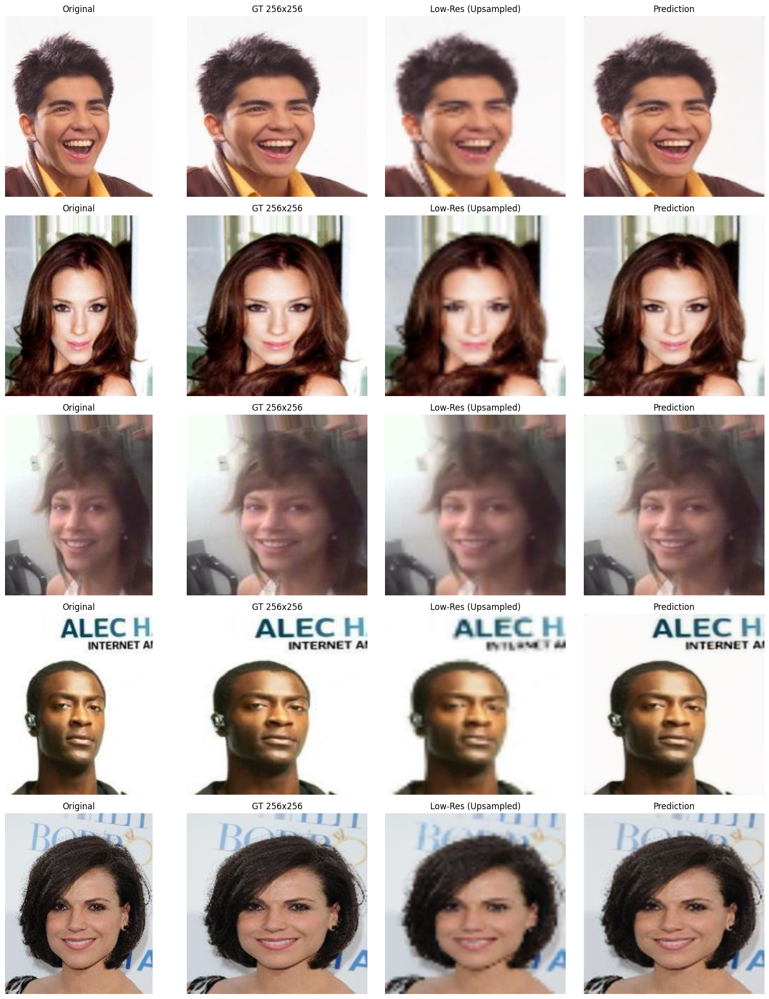

6331/6331 ━━━━━━━━━━━━━━━━━━━━ 950s 150ms/step - loss: 0.0140
Epoch 2/3
6331/6331 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - loss: 0.0137

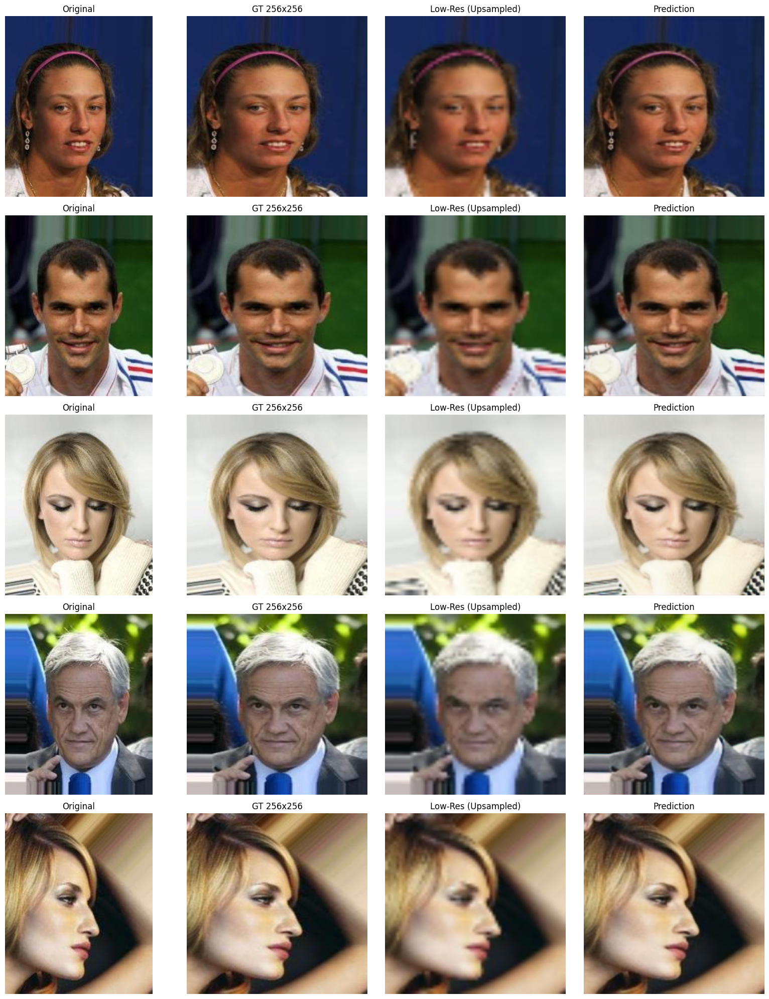

6331/6331 ━━━━━━━━━━━━━━━━━━━━ 1029s 162ms/step - loss: 0.0137
Epoch 3/3
6331/6331 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step - loss: 0.0134

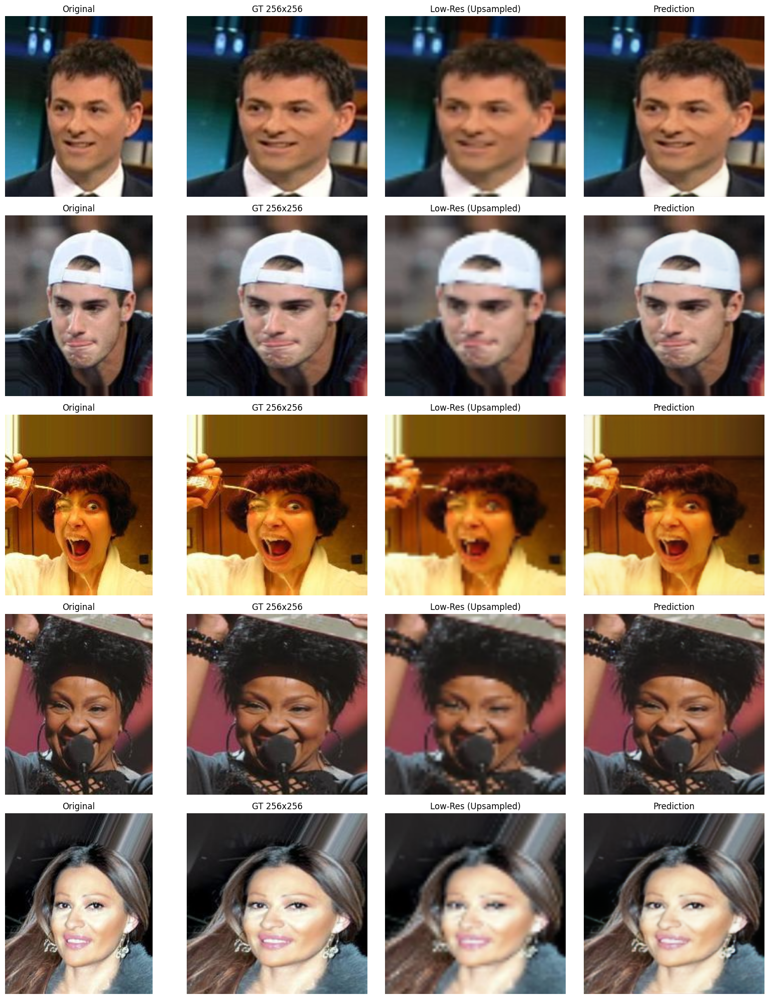

6331/6331 ━━━━━━━━━━━━━━━━━━━━ 1066s 168ms/step - loss: 0.0134


In [10]:
import os, cv2 as cv, numpy as np, matplotlib.pyplot as plt, tensorflow as tf

def show_and_save_samples(model, imgs, base_dir, epoch, n=5, save_dir='./epoch_samples'):
    os.makedirs(save_dir, exist_ok=True)
    chosen = np.random.choice(imgs, n, replace=False)
    fig, axes = plt.subplots(n, 4, figsize=(16, 4*n))
    if n == 1: axes = np.expand_dims(axes, 0)

    for i, fname in enumerate(chosen):
        path = os.path.join(base_dir, fname)
        rgb = cv.cvtColor(cv.imread(path), cv.COLOR_BGR2RGB)
        gt256 = cv.resize(rgb, (256,256)).astype('float32')/255 # Ground truth is 256x256
        img128 = cv.resize(rgb, (128,128)).astype('float32')/255 # Input to the model is 128x128
        img64 = cv.resize(rgb, (64,64)).astype('float32')/255 # Low-resolution for display
        pred  = model.predict(np.expand_dims(img128,0), verbose=0)[0] # Predict using 128x128 input
        lowup = cv.resize((img64*255).astype(np.uint8),(256,256)) # Low-res upsampled to 256x256 for display

        for ax, im, title in zip(axes[i],[rgb,gt256,lowup,pred],
                                 ['Original','GT 256x256','Low-Res (Upsampled)','Prediction']):
            ax.imshow(im); ax.set_title(title); ax.axis('off')

    plt.tight_layout(); plt.savefig(f"{save_dir}/epoch_{epoch+1:02d}.png"); plt.show()

# --- Simple Callbacks ---
def on_epoch_end(epoch, logs):
    # Use the updated base_dir here
    show_and_save_samples(model, imgs, base_dir, epoch, n=5)
    model.save(f'./checkpoints/model_epoch_{epoch+1:02d}.keras')

show_cb = tf.keras.callbacks.LambdaCallback(on_epoch_end=on_epoch_end)


batch_size = 32
# Replace this with the actual path to your CelebA dataset images
base_dir = '/kaggle/input/celeba-dataset/img_align_celeba/img_align_celeba/'
imgs = os.listdir(base_dir) # Update imgs list here as well
steps_per_epoch = len(imgs)//batch_size
os.makedirs('./checkpoints', exist_ok=True)

results = model.fit(
    datagen(batch_size=batch_size),
    steps_per_epoch=steps_per_epoch,
    epochs=3,
    callbacks=[show_cb],
    verbose=1)

# Project Summary

This notebook successfully implemented and trained a U-Net model for image super-resolution. The model was trained on the CelebA dataset, taking 128x128 images as input and generating 256x256 images.

The training process showed a decrease in the mean absolute error (MAE) loss over epochs, indicating that the model is learning to reconstruct higher-resolution images. The generated sample images at the end of each epoch provide a visual representation of the model's progress.

